In [3]:
import numpy as np
import h3
import pandas as pd
import os
import geopandas as gpd
import re
import shapely.wkb as swkb
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
import osmnx
from shapely.ops import unary_union
from geopy.geocoders import Nominatim
import geopy
from shapely.geometry import Point
from geopy.distance import geodesic
import seaborn as sns
import warnings

In [4]:
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [6]:
def load_raw_files():  
    path = r'..\data\external'
    #path = r'C:\Users\gcich\OneDrive\Pulpit\Magister\Semestr1\AnalizaDanychWNOZ\Projekt2\data\external'
#     path = r'C:\Users\User\Desktop\Projekt2\data\external'
    files = os.listdir(path)
    pattern = '.+parquet'
    source_files = []
    for file in files:
        if re.match(pattern, file):
            df = pd.read_parquet(os.path.join(path,file))
            source_files.append(df)
    return source_files

def extract_features(series):
    dict_of_lists = {}
    for d in series:
        for key, value in d.items():
            dict_of_lists.setdefault(key, []).append(value)
            
    return pd.DataFrame(data=dict_of_lists)

def create_gdf(df):
    df['geometry'] = df['geometry'].apply(lambda x: swkb.loads(x, hex = True))
    gdf = gpd.GeoDataFrame(data=df, geometry='geometry')
    gdf = gdf.set_crs('EPSG:4326')
    return gdf


In [7]:
data = load_raw_files()
df_ams = data[0]
df_krk = data[1]

gdf_ams = create_gdf(df_ams)
gdf_krk = create_gdf(df_krk)
gdf_ams.head(5)

,id,geometry,tags.abandoned:railway,tags.access,tags.access:conditional,tags.agricultural,tags.alt_name,tags.architect,tags.asphalt,tags.bicycle,...,tags.turn:lanes:forward,tags.two_sided,tags.usage,tags.vehicle,tags.wheelchair,tags.width,tags.wikidata,tags.wikimedia_commons,tags.wikipedia,tags.zone:traffic
0,4264947,"LINESTRING (4.92236 52.36544, 4.92237 52.36543...",None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,4270806,"LINESTRING (4.93089 52.36596, 4.93090 52.36585...",None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,4305753,"LINESTRING (4.86787 52.32198, 4.86787 52.32192)",None,None,None,None,None,None,None,None,...,None,None,None,None,None,6.00,None,None,None,None
3,4363637,"LINESTRING (4.91538 52.37115, 4.91544 52.37118...",None,None,None,None,None,None,None,None,...,None,None,None,None,None,2.40,Q19292742,None,None,None
4,4364612,"LINESTRING (4.92291 52.37384, 4.92291 52.37389...",None,yes,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


Text(492.5744949494949, 0.5, 'Szerokość geograficzna')

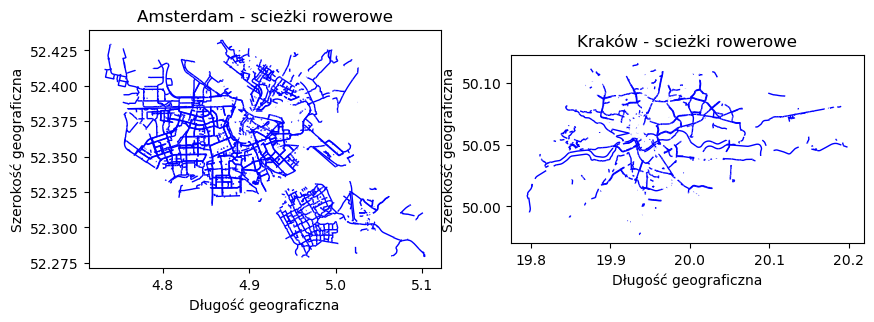

In [8]:
fig, axes = plt.subplots(1,2, figsize = [10, 10])
gdf_ams.plot(ax = axes[0], linewidth = 1, edgecolor = 'blue')

axes[0].set_title('Amsterdam - scieżki rowerowe')
axes[0].set_xlabel('Długość geograficzna')
axes[0].set_ylabel('Szerokość geograficzna')

gdf_krk.plot(ax = axes[1], linewidth = 1, edgecolor = 'blue')

axes[1].set_title('Kraków - scieżki rowerowe')
axes[1].set_xlabel('Długość geograficzna')
axes[1].set_ylabel('Szerokość geograficzna')

In [9]:
def get_boundary_coord(row, func, which):
    x, y = zip(*row.coords)
    return func(x) if which == 'x' else func(y)


buffer = 0.01
max_x = max(df_ams['geometry'].apply(lambda row: get_boundary_coord(row, max, 'x'))) + buffer
min_x = min(df_ams['geometry'].apply(lambda row: get_boundary_coord(row, min, 'x'))) - buffer
max_y = max(df_ams['geometry'].apply(lambda row: get_boundary_coord(row, max, 'y'))) + buffer
min_y = min(df_ams['geometry'].apply(lambda row: get_boundary_coord(row, min, 'y'))) - buffer
print(max_x, min_x, max_y, min_y)

5.1127658 4.7228487 52.441972799999995 52.268887500000005


In [10]:
geo = {
    'type': 'Polygon',
    'coordinates': [
        [
            [min_x, min_y],
            [min_x, max_y],
            [max_x, max_y],
            [max_x, min_y]
        ]
    ]
}

hexes = h3.polyfill(geo, 8)


(4.7228487, 5.1127658)

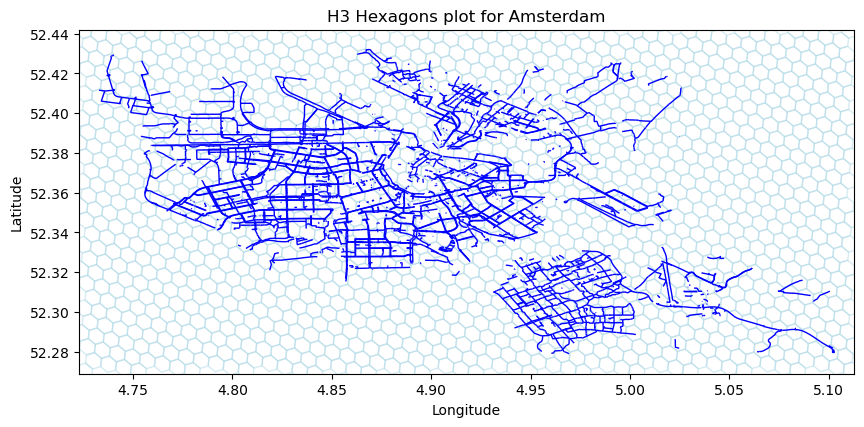

In [11]:
hex_polygons = [Polygon(h3.h3_to_geo_boundary(h3_index)) for h3_index in hexes]

# Create a GeoDataFrame with these hex polygons
gdf_ams_pol = gpd.GeoDataFrame(geometry=hex_polygons)
gdf_ams_pol = gdf_ams_pol.set_crs('EPSG:4326')

# Plot the hexagons
fig, ax = plt.subplots(figsize = (10,10))
gdf_ams_pol.plot(ax=ax, edgecolor='lightblue', facecolor='none', alpha=0.5)
gdf_ams.plot(ax = ax, linewidth = 1, edgecolor = 'blue')
# Set plot title and labels
ax.set_title('H3 Hexagons plot for Amsterdam')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.axis('square')
ax.set_ylim([min_y,max_y])
ax.set_xlim([min_x,max_x])

In [12]:
def create_h3_grid(df, epsg=4326):
    buffer = 0.01
    max_x = max(df['geometry'].apply(lambda row: get_boundary_coord(row, max, 'x'))) + buffer
    min_x = min(df['geometry'].apply(lambda row: get_boundary_coord(row, min, 'x'))) - buffer
    max_y = max(df['geometry'].apply(lambda row: get_boundary_coord(row, max, 'y'))) + buffer
    min_y = min(df['geometry'].apply(lambda row: get_boundary_coord(row, min, 'y'))) - buffer
    
    geo = {
        'type': 'Polygon',
        'coordinates': [
            [
                [min_x, min_y],
                [min_x, max_y],
                [max_x, max_y],
                [max_x, min_y]
            ]
        ]
    }

    hexes = h3.polyfill(geo, 8)
    hex_polygons = [Polygon(h3.h3_to_geo_boundary(h3_index)) for h3_index in hexes]

    gdf_pol = gpd.GeoDataFrame(geometry=hex_polygons)
    gdf_pol = gdf_pol.set_crs(epsg=epsg)
    return gdf_pol, (max_y, min_y,max_x, min_x)

In [13]:
gdf_krk_pol, bbox_krk = create_h3_grid(gdf_krk)

Pobranie danych dotyczących granic miasta

In [14]:
ams_area = osmnx.geocode_to_gdf("Amsterdam")
krk_area = osmnx.geocode_to_gdf("Kraków")

Text(60.972222222222214, 0.5, 'Latitude')

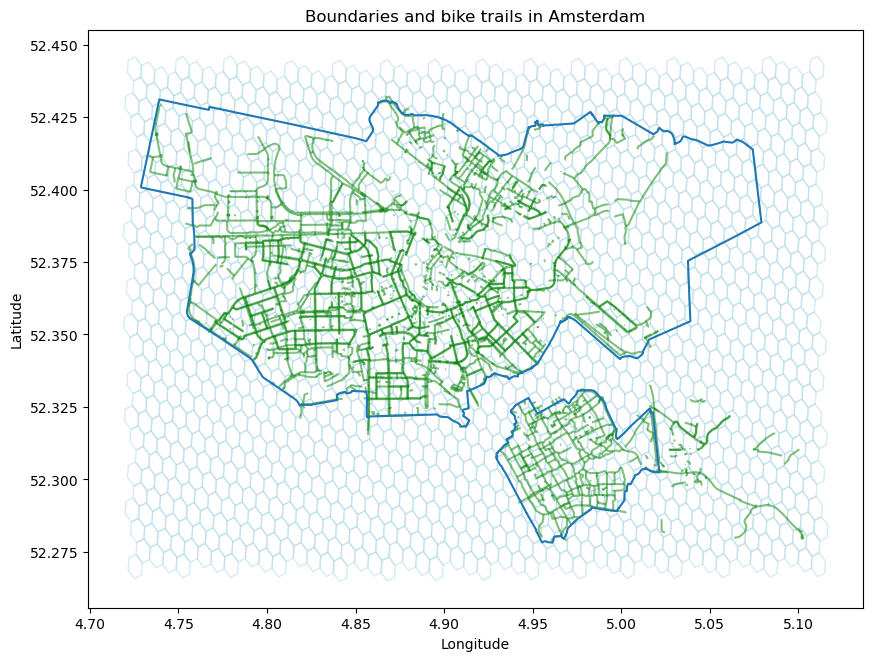

In [15]:
fig, ax = plt.subplots(figsize = (10,10))
gdf_ams.plot(ax=ax, edgecolor='green', facecolor='none', alpha=0.5)
gdf_ams_pol.plot(ax=ax, edgecolor='lightblue', facecolor='none', alpha=0.5)
ams_area['geometry'].boundary.plot(ax=ax)
# Set plot title and labels
ax.set_title('Boundaries and bike trails in Amsterdam')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

Text(60.972222222222214, 0.5, 'Latitude')

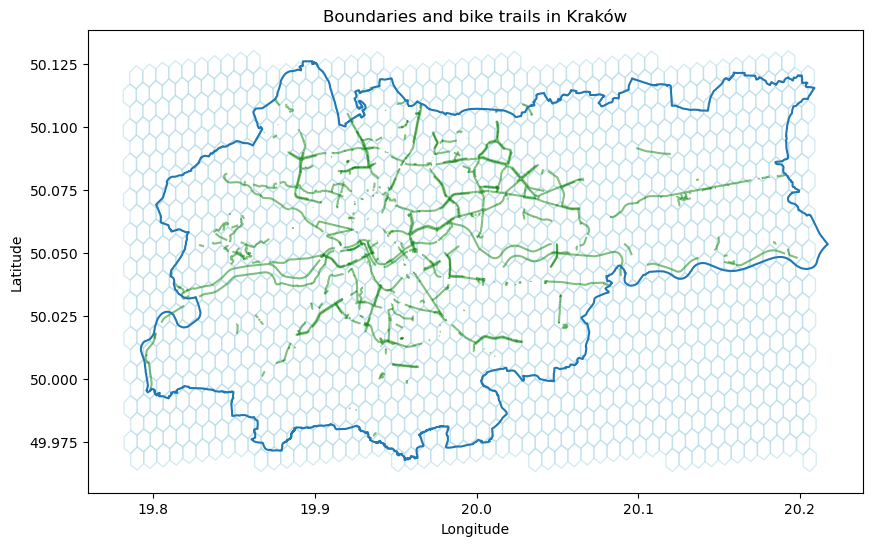

In [16]:
fig, ax = plt.subplots(figsize = (10,10))
gdf_krk.plot(ax=ax, edgecolor='green', facecolor='none', alpha=0.5)
gdf_krk_pol.plot(ax=ax, edgecolor='lightblue', facecolor='none', alpha=0.5)
krk_area['geometry'].boundary.plot(ax=ax)
# Set plot title and labels
ax.set_title('Boundaries and bike trails in Kraków')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

In [17]:
gdf_ams_proj = gdf_ams.to_crs(epsg=28992)
gdf_ams_pol = gdf_ams_pol.to_crs(epsg=28992)
ams_area_proj = ams_area.to_crs(epsg=28992)
gdf_ams_pol['bike_path_length'] = 0.0
gdf_ams_pol['within_city'] = False

for i, polygon in gdf_ams_pol.iterrows():
    clipped = gdf_ams_proj.clip(polygon.geometry)
    within_city = polygon.geometry.intersects(ams_area_proj.geometry)
    gdf_ams_pol.loc[i,'bike_path_length'] = clipped.length.sum()
    gdf_ams_pol.loc[i,'within_city'] = within_city[0]

gdf_ams_pol = gdf_ams_pol[(gdf_ams_pol['within_city'] == True) | (gdf_ams_pol['bike_path_length'] > 0)]
gdf_ams_pol = gdf_ams_pol.to_crs(epsg=4326)
gdf_ams_pol

,geometry,bike_path_length,within_city
0,"POLYGON ((4.92310 52.41735, 4.92708 52.41854, ...",206.087544,True
1,"POLYGON ((4.86912 52.41706, 4.87310 52.41825, ...",741.473718,True
3,"POLYGON ((4.96284 52.35752, 4.96683 52.35872, ...",469.120090,True
6,"POLYGON ((4.97253 52.30455, 4.97651 52.30575, ...",2221.874331,True
7,"POLYGON ((5.01897 52.30659, 5.02295 52.30779, ...",1922.459198,True
...,...,...,...
1408,"POLYGON ((5.03580 52.39148, 5.03977 52.39268, ...",0.000000,True
1409,"POLYGON ((4.80389 52.34955, 4.80788 52.35075, ...",3914.396988,True
1410,"POLYGON ((4.97788 52.35407, 4.98186 52.35527, ...",1166.097203,True
1413,"POLYGON ((4.93370 52.40858, 4.93768 52.40977, ...",1288.509301,True


Text(60.972222222222214, 0.5, 'Latitude')

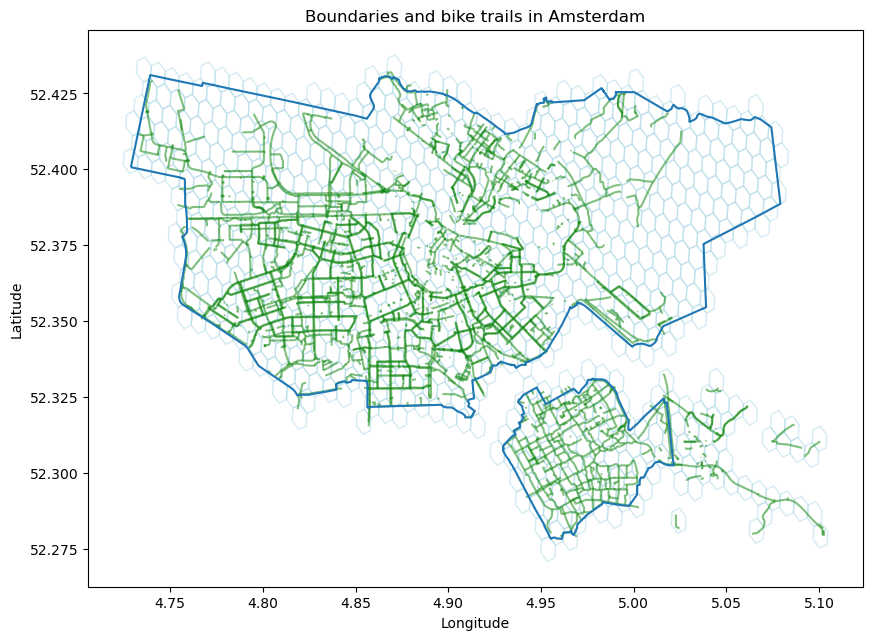

In [18]:
fig, ax = plt.subplots(figsize = (10,10))
gdf_ams.plot(ax=ax, edgecolor='green', facecolor='none', alpha=0.5)
gdf_ams_pol.plot(ax=ax, edgecolor='lightblue', facecolor='none', alpha=0.5)
ams_area['geometry'].boundary.plot(ax=ax)
# Set plot title and labels
ax.set_title('Boundaries and bike trails in Amsterdam')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

In [19]:
def crop_grid(hex_gdf, bikepath_gdf, area_gdf, epsg):
    bikepath_gdf_proj = bikepath_gdf.to_crs(epsg=epsg)
    hex_gdf = hex_gdf.to_crs(epsg=epsg)
    area_gdf_proj = area_gdf.to_crs(epsg=epsg)
    hex_gdf['bike_path_length'] = 0.0
    hex_gdf['within_city'] = False

    for i, polygon in hex_gdf.iterrows():
        clipped = bikepath_gdf_proj.clip(polygon.geometry)
        within_city = polygon.geometry.intersects(area_gdf_proj.geometry)
        hex_gdf.loc[i,'bike_path_length'] = clipped.length.sum()
        hex_gdf.loc[i,'within_city'] = within_city[0]

    hex_gdf = hex_gdf[(hex_gdf['within_city'] == True) | (hex_gdf['bike_path_length'] > 0)]
    hex_gdf = hex_gdf.to_crs(epsg=4326)
    del hex_gdf['within_city']
    return hex_gdf

Text(60.972222222222214, 0.5, 'Latitude')

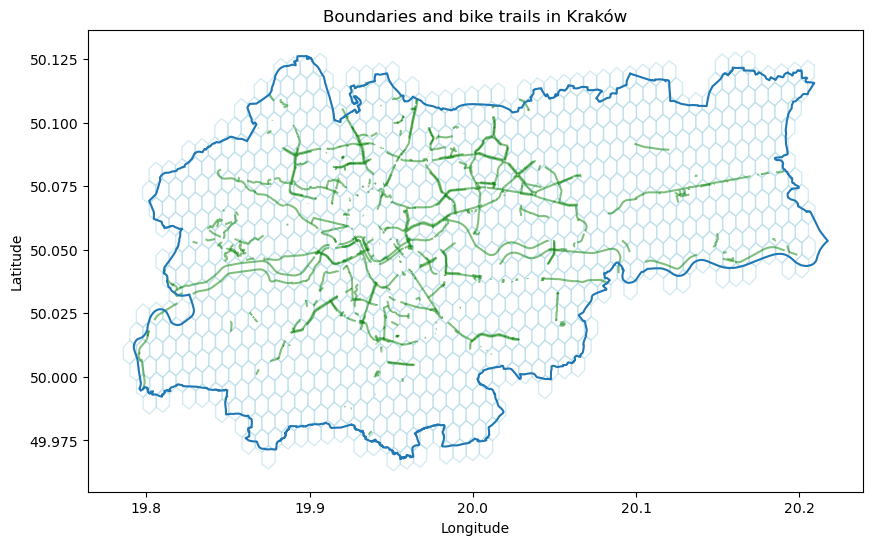

In [20]:
gdf_krk_pol = crop_grid(gdf_krk_pol, gdf_krk, krk_area, 2180)

fig, ax = plt.subplots(figsize = (10,10))
gdf_krk.plot(ax=ax, edgecolor='green', facecolor='none', alpha=0.5)
gdf_krk_pol.plot(ax=ax, edgecolor='lightblue', facecolor='none', alpha=0.5)
krk_area['geometry'].boundary.plot(ax=ax)
# Set plot title and labels
ax.set_title('Boundaries and bike trails in Kraków')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

In [21]:
G_roads = osmnx.graph_from_bbox(bbox=(max_y, min_y,max_x, min_x), network_type='drive')
G_walks = osmnx.graph_from_bbox(bbox=(max_y, min_y,max_x, min_x), network_type='walk')

# Convert the road network to a GeoDataFrame of edges
gdf_walks = osmnx.graph_to_gdfs(G_walks, nodes=False)
gdf_roads = osmnx.graph_to_gdfs(G_roads, nodes=False)

gdf_roads.head(5)

osmid       highway maxspeed  \
u        v          key                                                         
6316199  46379627   0    [38297120, 7372610, 38297119]   residential       30   
         46389218   0                          7372614   residential       30   
25596477 4489285115 0                         23289375  unclassified       30   
25658579 1334338691 0           [118689924, 118689927]   residential       30   
26203121 2311089467 0               [7373692, 7382053]   residential       30   

                         oneway       reversed   length bridge  \
u        v          key                                          
6316199  46379627   0     False          False   42.497    yes   
         46389218   0      True          False  225.577    NaN   
25596477 4489285115 0     False          False   81.156    NaN   
25658579 1334338691 0     False  [False, True]   37.997    NaN   
26203121 2311089467 0      True          False  193.316    NaN   

                                                                    name  \
u        v          key                                                    
6316199  46379627   0         [Joes Kloppenburgbrug, Oude Spiegelstraat]   
         46389218   0                                             Singel   
25596477 4489285115 0                                 Nieuwe Herengracht   
25658579 1334338691 0                                       Roomtuintjes   
26203121 2311089467 0    [Nicolaas Beetsplantsoen, Jacob van Lennepkade]   

                                                                  geometry  \
u        v          key                                                      
6316199  46379627   0    LINESTRING (4.88840 52.37017, 4.88827 52.37018...   
         46389218   0    LINESTRING (4.88840 52.37017, 4.88873 52.37195...   
25596477 4489285115 0    LINESTRING (4.90610 52.36700, 4.90612 52.36702...   
25658579 1334338691 0    LINESTRING (4.93042 52.36454, 4.92999 52.36445...   
26203121 2311089467 0    LINESTRING (4.86524 52.36416, 4.86550 52.36376...   

                        lanes width  ref access junction tunnel est_width area  
u        v          key                                                         
6316199  46379627   0     NaN   NaN  NaN    NaN      NaN    NaN       NaN  NaN  
         46389218   0     NaN   NaN  NaN    NaN      NaN    NaN       NaN  NaN  
25596477 4489285115 0     NaN   NaN  NaN    NaN      NaN    NaN       NaN  NaN  
25658579 1334338691 0     NaN   NaN  NaN    NaN      NaN    NaN       NaN  NaN  
26203121 2311089467 0       1     4  NaN    NaN      NaN    NaN       NaN  NaN

In [22]:
gdf_roads['highway'].apply(lambda x: x[0] if isinstance(x, list) else x).unique()

gdf_roads_main = gdf_roads[gdf_roads['highway'].isin(['secondary', 'primary', 'tertiary', 'busway',
       'motorway_link', 'motorway'])]

gdf_roads_main.head(3)

,,,osmid,highway,maxspeed,oneway,reversed,length,bridge,name,geometry,lanes,width,ref,access,junction,tunnel,est_width,area
u,v,key,,,,,,,,,,,,,,,,,
27561854,46311177,0,147577798,secondary,30,True,False,217.778,NaN,Amstelveenseweg,"LINESTRING (4.85468 52.35639, 4.85486 52.35605...",1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29529317,46360122,0,"[7045705, 258138666, 738258604, 738258605, 115...",primary,30,True,False,374.502,NaN,Zeeburgerdijk,"LINESTRING (4.93228 52.36611, 4.93202 52.36610...",NaN,NaN,S100,NaN,NaN,NaN,NaN,NaN
30741325,306596544,0,"[155304272, 155304271, 7390927]",tertiary,50,False,False,26.836,yes,Aalsmeerderweg,"LINESTRING (4.76793 52.27019, 4.76806 52.27023...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
hex_area = unary_union(gdf_ams_pol.geometry)
gdf_roads_main_clipped = gdf_roads_main.geometry.clip(hex_area)
gdf_walks_clipped = gdf_walks.geometry.clip(hex_area)

In [24]:
gdf_ams_pol = gdf_ams_pol.to_crs(epsg=28992)
gdf_roads_main_clipped_proj = gdf_roads_main_clipped.to_crs(epsg=28992)
gdf_walks_clipped_proj = gdf_walks_clipped.to_crs(epsg=28992)
gdf_ams_pol['main_roads_length'] = 0.0
gdf_ams_pol['walks_length'] = 0.0
for i, polygon in gdf_ams_pol.iterrows():

    clipped_r = gdf_roads_main_clipped_proj.clip(polygon.geometry)
    clipped_w = gdf_walks_clipped_proj.clip(polygon.geometry)
    gdf_ams_pol.loc[i,'main_roads_length'] = clipped_r.length.sum()
    gdf_ams_pol.loc[i,'walks_length'] = clipped_w.length.sum()

gdf_ams_pol = gdf_ams_pol.to_crs(epsg=4326)
gdf_ams_pol

,geometry,bike_path_length,within_city,main_roads_length,walks_length
0,"POLYGON ((4.92310 52.41735, 4.92708 52.41854, ...",206.087544,True,2098.509540,5813.489633
1,"POLYGON ((4.86912 52.41706, 4.87310 52.41825, ...",741.473718,True,654.011608,12426.317471
3,"POLYGON ((4.96284 52.35752, 4.96683 52.35872, ...",469.120090,True,2341.332799,16288.325466
6,"POLYGON ((4.97253 52.30455, 4.97651 52.30575, ...",2221.874331,True,2135.979607,22099.434776
7,"POLYGON ((5.01897 52.30659, 5.02295 52.30779, ...",1922.459198,True,4003.971395,9222.543796
...,...,...,...,...,...
1408,"POLYGON ((5.03580 52.39148, 5.03977 52.39268, ...",0.000000,True,0.000000,0.000000
1409,"POLYGON ((4.80389 52.34955, 4.80788 52.35075, ...",3914.396988,True,2321.388784,30118.913676
1410,"POLYGON ((4.97788 52.35407, 4.98186 52.35527, ...",1166.097203,True,0.000000,15153.495338
1413,"POLYGON ((4.93370 52.40858, 4.93768 52.40977, ...",1288.509301,True,5145.555305,17977.505795


Text(60.972222222222214, 0.5, 'Latitude')

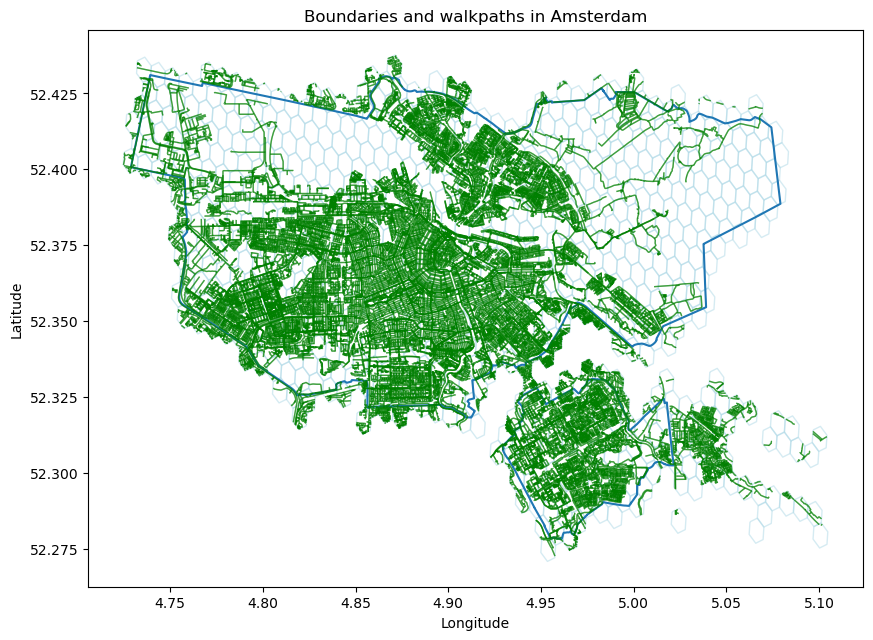

In [25]:
fig, ax = plt.subplots(figsize = (10,10))
ams_area['geometry'].boundary.plot(ax=ax)
# gdf_roads_main_clipped.plot(ax=ax, edgecolor='green', facecolor='none', alpha=0.5,linewidth = 1)
gdf_walks_clipped.plot(ax=ax, edgecolor='green', facecolor='none', alpha=0.5,linewidth = 1)
gdf_ams_pol.plot(ax=ax, edgecolor='lightblue', facecolor='none', alpha=0.5)
ax.set_title('Boundaries and walkpaths in Amsterdam')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

Text(60.972222222222214, 0.5, 'Latitude')

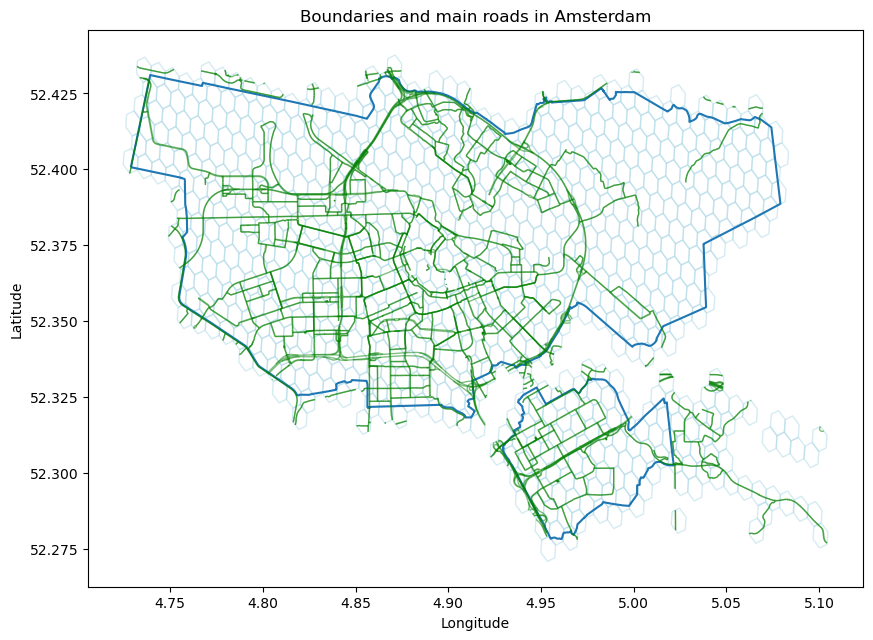

In [26]:
fig, ax = plt.subplots(figsize = (10,10))
ams_area['geometry'].boundary.plot(ax=ax)
gdf_roads_main_clipped.plot(ax=ax, edgecolor='green', facecolor='none', alpha=0.5,linewidth = 1)
gdf_ams_pol.plot(ax=ax, edgecolor='lightblue', facecolor='none', alpha=0.5)
ax.set_title('Boundaries and main roads in Amsterdam')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

In [27]:
def get_roads_and_walks_length_by_hex(hex_gdf, bbox, hex_area, epsg):
    try:
        G_roads = osmnx.graph_from_bbox(bbox=bbox, network_type='drive')
        G_walks = osmnx.graph_from_bbox(bbox=bbox, network_type='walk')

        # Convert the road network to a GeoDataFrame of edges
        gdf_walks = osmnx.graph_to_gdfs(G_walks, nodes=False)
        gdf_roads = osmnx.graph_to_gdfs(G_roads, nodes=False)
        
        gdf_roads['highway'].apply(lambda x: x[0] if isinstance(x, list) else x).unique()
        gdf_roads_main = gdf_roads[gdf_roads['highway'].isin(['secondary', 'primary', 'tertiary', 'busway',
            'motorway_link', 'motorway'])]
        
        gdf_roads_main_clipped = gdf_roads_main.geometry.clip(hex_area)
        gdf_walks_clipped = gdf_walks.geometry.clip(hex_area)
        
        old_epsg = hex_gdf.crs.to_epsg()
        hex_gdf = hex_gdf.to_crs(epsg=epsg)
        gdf_roads_main_clipped_proj = gdf_roads_main_clipped.to_crs(epsg=epsg)
        gdf_walks_clipped_proj = gdf_walks_clipped.to_crs(epsg=epsg)
        hex_gdf['main_roads_length'] = 0.0
        hex_gdf['walks_length'] = 0.0
        
        for i, polygon in hex_gdf.iterrows():
            clipped_r = gdf_roads_main_clipped_proj.clip(polygon.geometry)
            clipped_w = gdf_walks_clipped_proj.clip(polygon.geometry)
            hex_gdf.loc[i,'main_roads_length'] = clipped_r.length.sum()
            hex_gdf.loc[i,'walks_length'] = clipped_w.length.sum()

        hex_gdf = hex_gdf.to_crs(epsg=old_epsg)
        return hex_gdf
    except Exception as e:
        raise Exception(f"Error in build_fetures.get_roads_and_walks_length_by_hex: {e}")

In [28]:
hex_area_krk = unary_union(gdf_krk_pol.geometry)
gdf_krk_pol = get_roads_and_walks_length_by_hex(gdf_krk_pol,bbox_krk, hex_area_krk, 2180)
gdf_krk_pol

,geometry,bike_path_length,main_roads_length,walks_length
0,"POLYGON ((20.04005 50.02097, 20.03602 50.01833...",0.000000,2045.938824,10299.620003
1,"POLYGON ((19.89055 50.04318, 19.88653 50.04055...",601.074232,1198.911548,10221.141997
3,"POLYGON ((19.81007 49.99520, 19.80605 49.99257...",0.000000,0.000000,2985.767676
4,"POLYGON ((19.87822 50.09041, 19.87420 50.08778...",132.809314,1132.309188,22243.527807
5,"POLYGON ((19.99975 50.00384, 19.99573 50.00121...",0.000000,963.736359,16738.397276
...,...,...,...,...
1201,"POLYGON ((20.07227 50.03744, 20.06825 50.03480...",594.930899,1236.114292,8712.770615
1202,"POLYGON ((19.88215 50.11140, 19.87813 50.10877...",315.691166,562.269926,6966.941055
1203,"POLYGON ((19.95095 50.06885, 19.94693 50.06622...",1742.057905,5244.227377,62680.403588
1204,"POLYGON ((19.91496 50.00379, 19.91093 50.00116...",0.000000,445.531175,16061.984647


In [29]:
def get_city_center_gdf(city_name):
    try:
         
        geolocator = Nominatim(user_agent="my-app")
        location = geolocator.geocode(city_name)
        if isinstance(location, geopy.location.Location):
            center_gdf = gpd.GeoDataFrame(geometry=[Point(location.longitude, location.latitude)],crs=4326) 
            return center_gdf
        
        print(f"Failed to get {city_name} center.")
        return None
        
    except Exception as e:
        print(f"Failed to get {city_name} center: {e}")
        return None


In [30]:
gdf_center_ams = get_city_center_gdf('Amsterdam')
gdf_center_krk = get_city_center_gdf('Krakow')
gdf_center_ams

,geometry
0,POINT (4.89245 52.37308)


Text(1031.4267676767674, 0.5, 'Latitude')

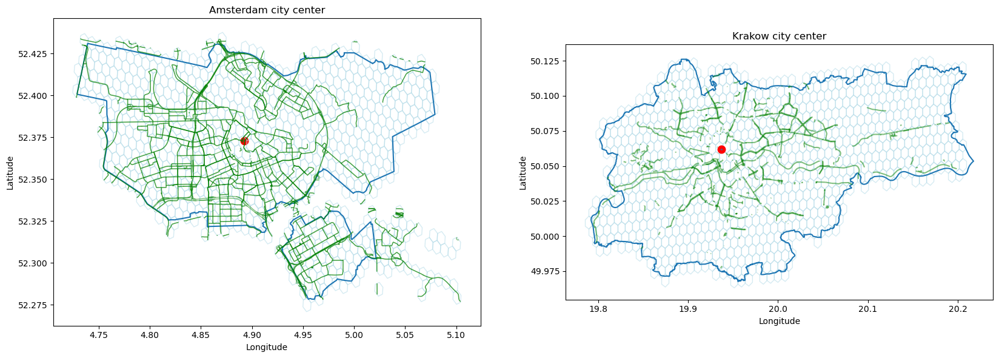

In [31]:
fig, ax = plt.subplots(1,2, figsize = (20,10))
ams_area['geometry'].boundary.plot(ax=ax[0])
gdf_roads_main_clipped.plot(ax=ax[0], edgecolor='green', facecolor='none', alpha=0.5,linewidth = 1)
gdf_center_ams.plot(ax=ax[0], linewidth=4, edgecolor='red')
gdf_ams_pol.plot(ax=ax[0], edgecolor='lightblue', facecolor='none', alpha=0.5)
ax[0].set_title('Amsterdam city center')
ax[0].set_xlabel('Longitude')
ax[0].set_ylabel('Latitude')

krk_area['geometry'].boundary.plot(ax=ax[1])

gdf_krk_pol.plot(ax=ax[1], edgecolor='lightblue', facecolor='none', alpha=0.5)
gdf_center_krk.plot(ax=ax[1], linewidth=4, edgecolor='red')
gdf_krk.plot(ax=ax[1], edgecolor='green', facecolor='none', alpha=0.5)
ax[1].set_title('Krakow city center')
ax[1].set_xlabel('Longitude')
ax[1].set_ylabel('Latitude')

In [32]:
def get_hex_dist_to_city_center(hex_gdf, center_gdf, epsg):
    old_epsg = hex_gdf.crs.to_epsg()
    center_gdf_proj = center_gdf.to_crs(epsg=epsg)
    hex_gdf = hex_gdf.to_crs(epsg=epsg)

    hex_gdf['dist_to_city_center[m]'] = hex_gdf.geometry.centroid.distance(center_gdf_proj.iloc[0,0])
    hex_gdf = hex_gdf.to_crs(epsg=old_epsg)
    return hex_gdf

In [33]:
gdf_ams_pol = get_hex_dist_to_city_center(gdf_ams_pol, gdf_center_ams, 28992)
gdf_ams_pol

,geometry,bike_path_length,within_city,main_roads_length,walks_length,dist_to_city_center[m]
0,"POLYGON ((4.92310 52.41735, 4.92708 52.41854, ...",206.087544,True,2098.509540,5813.489633,5154.879288
1,"POLYGON ((4.86912 52.41706, 4.87310 52.41825, ...",741.473718,True,654.011608,12426.317471,4762.373953
3,"POLYGON ((4.96284 52.35752, 4.96683 52.35872, ...",469.120090,True,2341.332799,16288.325466,5439.435727
6,"POLYGON ((4.97253 52.30455, 4.97651 52.30575, ...",2221.874331,True,2135.979607,22099.434776,9781.879987
7,"POLYGON ((5.01897 52.30659, 5.02295 52.30779, ...",1922.459198,True,4003.971395,9222.543796,11756.381291
...,...,...,...,...,...,...
1408,"POLYGON ((5.03580 52.39148, 5.03977 52.39268, ...",0.000000,True,0.000000,0.000000,10147.838634
1409,"POLYGON ((4.80389 52.34955, 4.80788 52.35075, ...",3914.396988,True,2321.388784,30118.913676,6496.898462
1410,"POLYGON ((4.97788 52.35407, 4.98186 52.35527, ...",1166.097203,True,0.000000,15153.495338,6532.777122
1413,"POLYGON ((4.93370 52.40858, 4.93768 52.40977, ...",1288.509301,True,5145.555305,17977.505795,4735.933155


In [34]:
def calculate_building_points(hex_gdf, poi_type='building'):
    G_poi = osmnx.geometries_from_polygon(hex_gdf.geometry.unary_union, tags={poi_type: True})
    poi_points = G_poi[['geometry']]
    
    hex_gdf[f'{poi_type}_count'] = hex_gdf.geometry.apply(lambda polygon: poi_points.geometry.within(polygon).sum())
    
    return hex_gdf

In [35]:
gdf_ams_pol = calculate_building_points(gdf_ams_pol)
gdf_ams_pol

C:\Users\Marcin\AppData\Local\Temp\ipykernel_27976\910374991.py:2: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  G_poi = osmnx.geometries_from_polygon(hex_gdf.geometry.unary_union, tags={poi_type: True})


,geometry,bike_path_length,within_city,main_roads_length,walks_length,dist_to_city_center[m],building_count
0,"POLYGON ((4.92310 52.41735, 4.92708 52.41854, ...",206.087544,True,2098.509540,5813.489633,5154.879288,29
1,"POLYGON ((4.86912 52.41706, 4.87310 52.41825, ...",741.473718,True,654.011608,12426.317471,4762.373953,67
3,"POLYGON ((4.96284 52.35752, 4.96683 52.35872, ...",469.120090,True,2341.332799,16288.325466,5439.435727,256
6,"POLYGON ((4.97253 52.30455, 4.97651 52.30575, ...",2221.874331,True,2135.979607,22099.434776,9781.879987,190
7,"POLYGON ((5.01897 52.30659, 5.02295 52.30779, ...",1922.459198,True,4003.971395,9222.543796,11756.381291,165
...,...,...,...,...,...,...,...
1408,"POLYGON ((5.03580 52.39148, 5.03977 52.39268, ...",0.000000,True,0.000000,0.000000,10147.838634,0
1409,"POLYGON ((4.80389 52.34955, 4.80788 52.35075, ...",3914.396988,True,2321.388784,30118.913676,6496.898462,1815
1410,"POLYGON ((4.97788 52.35407, 4.98186 52.35527, ...",1166.097203,True,0.000000,15153.495338,6532.777122,495
1413,"POLYGON ((4.93370 52.40858, 4.93768 52.40977, ...",1288.509301,True,5145.555305,17977.505795,4735.933155,458


In [36]:
def get_green_spaces(bbox):
    green_tags = ['park', 'garden', 'forest', 'meadow', 'grass', 'recreation_ground', 'village_green']
    gdf_green = osmnx.geometries_from_bbox(*bbox, tags={'leisure': green_tags, 'landuse': green_tags, 'natural': ['wood', 'grassland']})
    return gdf_green
def get_green_space_by_hex(hex_gdf, bbox, hex_area, epsg):
    try:
        gdf_green = get_green_spaces(bbox)
        gdf_green_clipped = gdf_green.geometry.clip(hex_area)

        old_epsg = hex_gdf.crs.to_epsg()
        hex_gdf = hex_gdf.to_crs(epsg=epsg)
        gdf_green_clipped_proj = gdf_green_clipped.to_crs(epsg=epsg)
        hex_gdf['green_space_area'] = 0.0

        for i, polygon in hex_gdf.iterrows():
            clipped_g = gdf_green_clipped_proj.clip(polygon.geometry)
            hex_gdf.loc[i, 'green_space_area'] = clipped_g.area.sum()

        hex_gdf = hex_gdf.to_crs(epsg=old_epsg)
        return hex_gdf
    except Exception as e:
        raise Exception(f"Error in get_green_space_by_hex: {e}")

In [37]:
hex_area_ams = unary_union(gdf_ams_pol.geometry)
bbox_ams = (max_y, min_y, max_x, min_x)
gdf_ams_pol = get_green_space_by_hex(gdf_ams_pol, bbox_ams, hex_area_ams, 28992)
gdf_ams_pol

C:\Users\Marcin\AppData\Local\Temp\ipykernel_27976\238258605.py:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf_green = osmnx.geometries_from_bbox(*bbox, tags={'leisure': green_tags, 'landuse': green_tags, 'natural': ['wood', 'grassland']})
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\osmnx\geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)


,geometry,bike_path_length,within_city,main_roads_length,walks_length,dist_to_city_center[m],building_count,green_space_area
0,"POLYGON ((4.92310 52.41735, 4.92708 52.41854, ...",206.087544,True,2098.509540,5813.489633,5154.879288,29,226720.382262
1,"POLYGON ((4.86912 52.41706, 4.87310 52.41825, ...",741.473718,True,654.011608,12426.317471,4762.373953,67,64420.957879
3,"POLYGON ((4.96284 52.35752, 4.96683 52.35872, ...",469.120090,True,2341.332799,16288.325466,5439.435727,256,282819.839518
6,"POLYGON ((4.97253 52.30455, 4.97651 52.30575, ...",2221.874331,True,2135.979607,22099.434776,9781.879987,190,219504.399426
7,"POLYGON ((5.01897 52.30659, 5.02295 52.30779, ...",1922.459198,True,4003.971395,9222.543796,11756.381291,165,131286.653227
...,...,...,...,...,...,...,...,...
1408,"POLYGON ((5.03580 52.39148, 5.03977 52.39268, ...",0.000000,True,0.000000,0.000000,10147.838634,0,0.000000
1409,"POLYGON ((4.80389 52.34955, 4.80788 52.35075, ...",3914.396988,True,2321.388784,30118.913676,6496.898462,1815,88664.374879
1410,"POLYGON ((4.97788 52.35407, 4.98186 52.35527, ...",1166.097203,True,0.000000,15153.495338,6532.777122,495,162792.208498
1413,"POLYGON ((4.93370 52.40858, 4.93768 52.40977, ...",1288.509301,True,5145.555305,17977.505795,4735.933155,458,118207.036121


In [38]:
def get_service_points(bbox):
    service_tags = ['restaurant', 'cafe', 'hospital', 'school', 'shop']
    gdf_services = osmnx.geometries_from_bbox(*bbox, tags={'amenity': service_tags, 'shop': True})
    return gdf_services

def get_service_points_by_hex(hex_gdf, bbox, hex_area, epsg):
    try:
        gdf_services = get_service_points(bbox)
        gdf_services_clipped = gdf_services.geometry.clip(hex_area)

        old_epsg = hex_gdf.crs.to_epsg()
        hex_gdf = hex_gdf.to_crs(epsg=epsg)
        gdf_services_clipped_proj = gdf_services_clipped.to_crs(epsg=epsg)
        hex_gdf['service_point_count'] = 0

        for i, polygon in hex_gdf.iterrows():
            clipped_s = gdf_services_clipped_proj.clip(polygon.geometry)
            hex_gdf.loc[i, 'service_point_count'] = clipped_s.shape[0]

        hex_gdf = hex_gdf.to_crs(epsg=old_epsg)
        return hex_gdf
    except Exception as e:
        raise Exception(f"Error in get_service_points_by_hex: {e}")

In [39]:
bbox_ams = (max_y, min_y, max_x, min_x)
gdf_ams_pol = get_service_points_by_hex(gdf_ams_pol, bbox_ams, hex_area_ams, 28992)
gdf_ams_pol

C:\Users\Marcin\AppData\Local\Temp\ipykernel_27976\3704804016.py:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf_services = osmnx.geometries_from_bbox(*bbox, tags={'amenity': service_tags, 'shop': True})
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\osmnx\geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)


,geometry,bike_path_length,within_city,main_roads_length,walks_length,dist_to_city_center[m],building_count,green_space_area,service_point_count
0,"POLYGON ((4.92310 52.41735, 4.92708 52.41854, ...",206.087544,True,2098.509540,5813.489633,5154.879288,29,226720.382262,0
1,"POLYGON ((4.86912 52.41706, 4.87310 52.41825, ...",741.473718,True,654.011608,12426.317471,4762.373953,67,64420.957879,0
3,"POLYGON ((4.96284 52.35752, 4.96683 52.35872, ...",469.120090,True,2341.332799,16288.325466,5439.435727,256,282819.839518,0
6,"POLYGON ((4.97253 52.30455, 4.97651 52.30575, ...",2221.874331,True,2135.979607,22099.434776,9781.879987,190,219504.399426,0
7,"POLYGON ((5.01897 52.30659, 5.02295 52.30779, ...",1922.459198,True,4003.971395,9222.543796,11756.381291,165,131286.653227,0
...,...,...,...,...,...,...,...,...,...
1408,"POLYGON ((5.03580 52.39148, 5.03977 52.39268, ...",0.000000,True,0.000000,0.000000,10147.838634,0,0.000000,0
1409,"POLYGON ((4.80389 52.34955, 4.80788 52.35075, ...",3914.396988,True,2321.388784,30118.913676,6496.898462,1815,88664.374879,12
1410,"POLYGON ((4.97788 52.35407, 4.98186 52.35527, ...",1166.097203,True,0.000000,15153.495338,6532.777122,495,162792.208498,5
1413,"POLYGON ((4.93370 52.40858, 4.93768 52.40977, ...",1288.509301,True,5145.555305,17977.505795,4735.933155,458,118207.036121,0


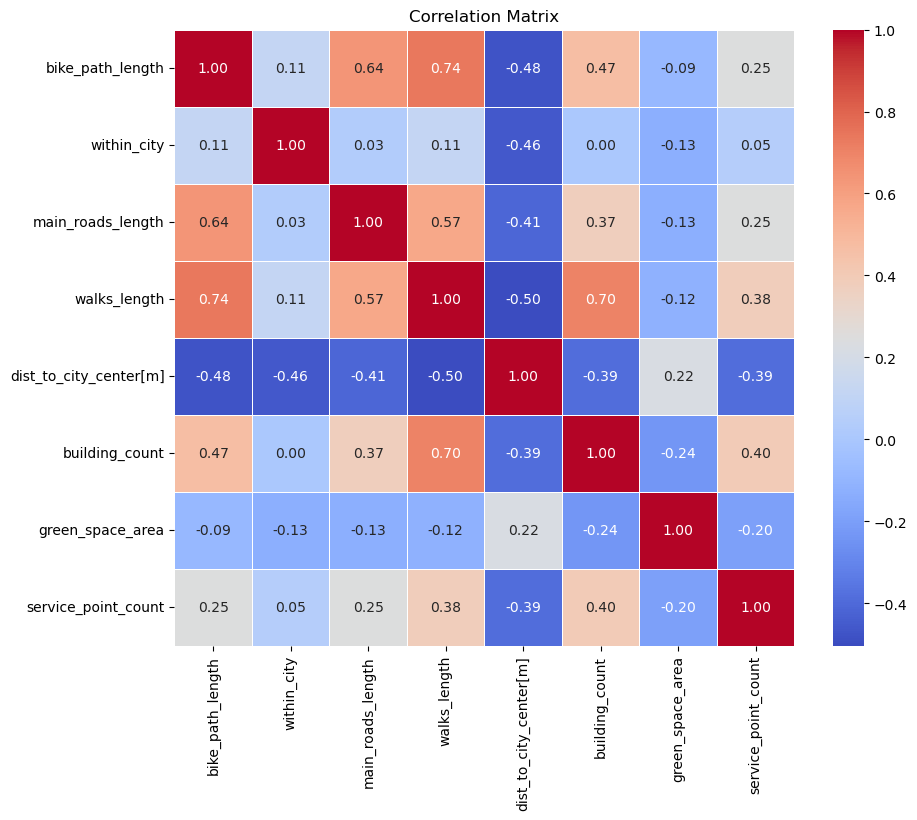

In [40]:
correlation_matrix = gdf_ams_pol[['bike_path_length', 'within_city', 'main_roads_length', 'walks_length', 'dist_to_city_center[m]', 'building_count', 'green_space_area', 'service_point_count']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\sit

<Figure size 1200x800 with 0 Axes>

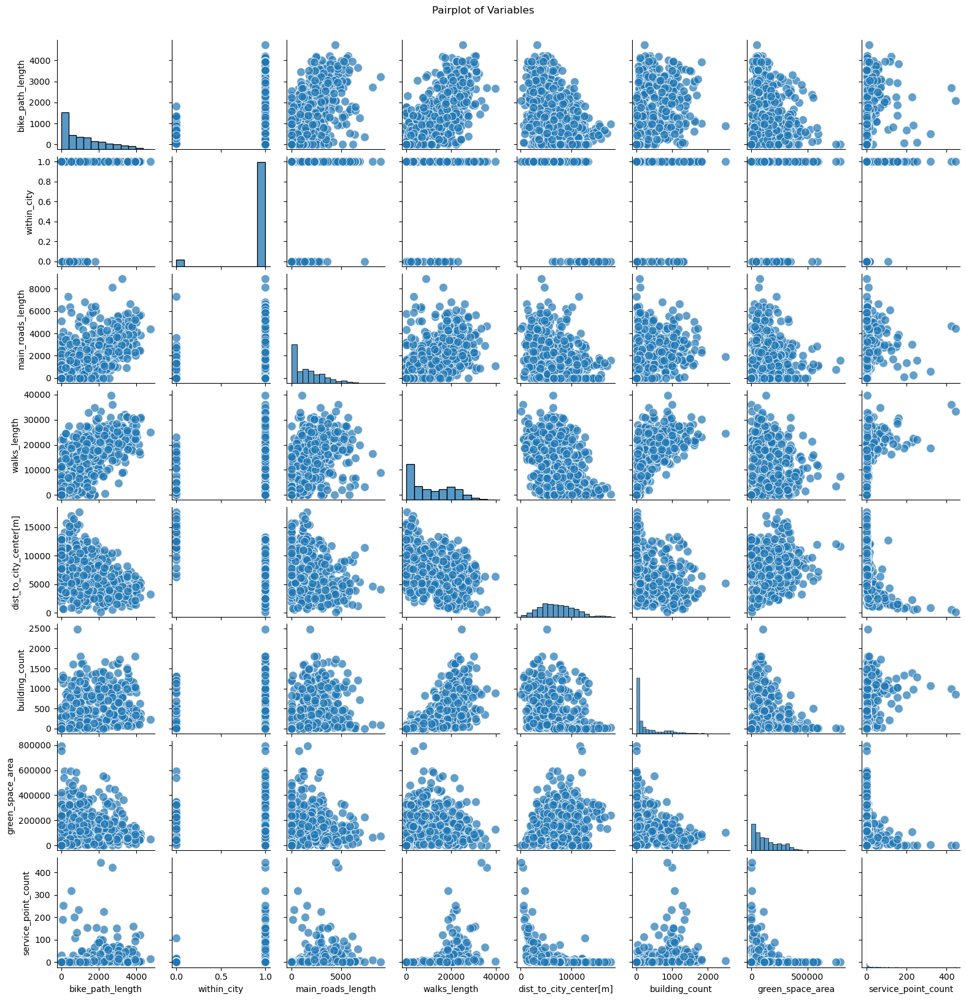

In [41]:
plt.figure(figsize=(12, 8))
sns.pairplot(data=gdf_ams_pol, vars=['bike_path_length', 'within_city', 'main_roads_length', 'walks_length', 'dist_to_city_center[m]', 'building_count', 'green_space_area', 'service_point_count'], palette='viridis', plot_kws={'alpha':0.7, 's':100}, height=2)
plt.suptitle('Pairplot of Variables', y=1.02)
plt.show()

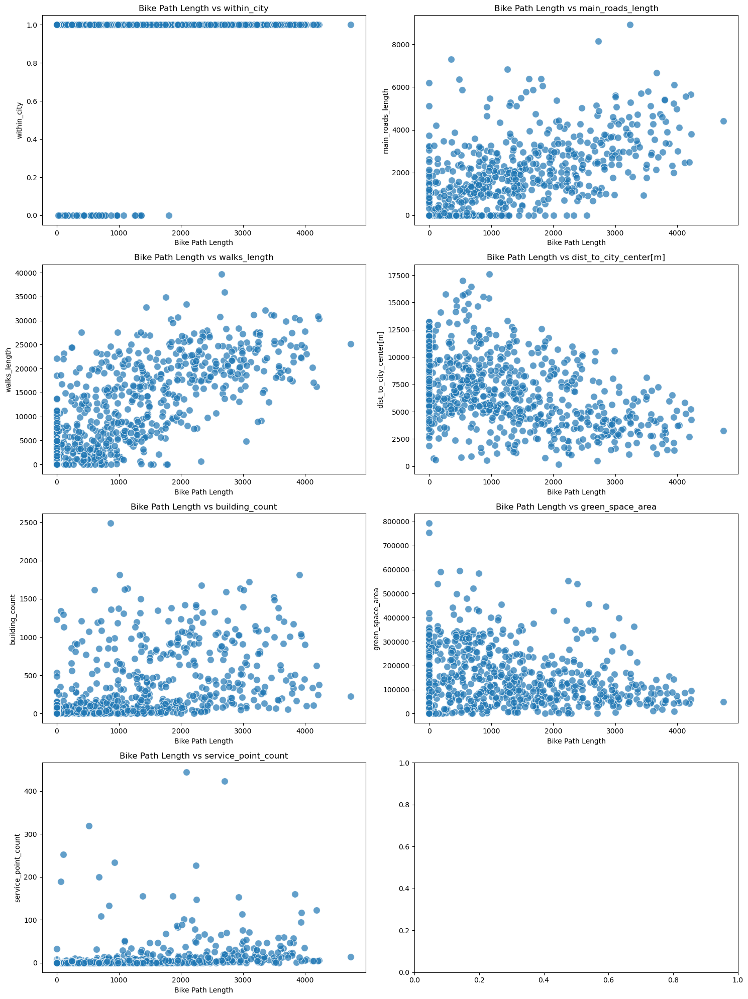

In [42]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

for i, var in enumerate(['within_city', 'main_roads_length', 'walks_length', 'dist_to_city_center[m]', 'building_count', 'green_space_area', 'service_point_count']):
    row = i // 2
    col = i % 2
    sns.scatterplot(x='bike_path_length', y=var, data=gdf_ams_pol, alpha=0.7, s=100, ax=axes[row, col])
    axes[row, col].set_title(f'Bike Path Length vs {var}')
    axes[row, col].set_xlabel('Bike Path Length')
    axes[row, col].set_ylabel(var)

plt.tight_layout()
plt.show()

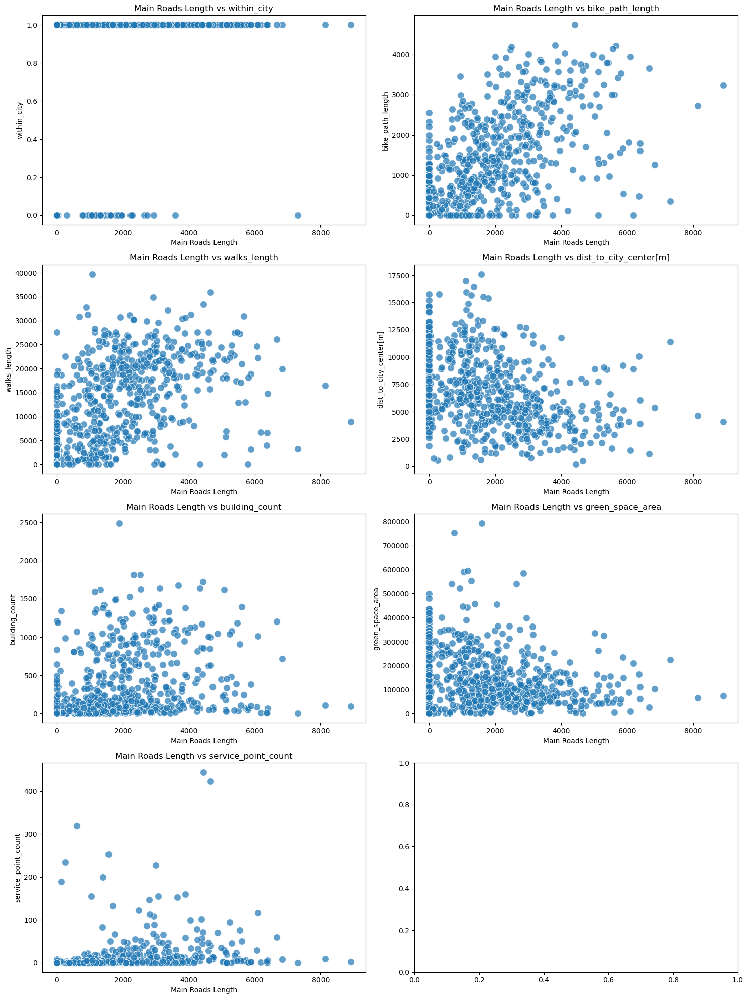

In [43]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

for i, var in enumerate(['within_city', 'bike_path_length', 'walks_length', 'dist_to_city_center[m]', 'building_count', 'green_space_area', 'service_point_count']):
    row = i // 2
    col = i % 2
    sns.scatterplot(x='main_roads_length', y=var, data=gdf_ams_pol, alpha=0.7, s=100, ax=axes[row, col])
    axes[row, col].set_title(f'Main Roads Length vs {var}')
    axes[row, col].set_xlabel('Main Roads Length')
    axes[row, col].set_ylabel(var)

plt.tight_layout()
plt.show()

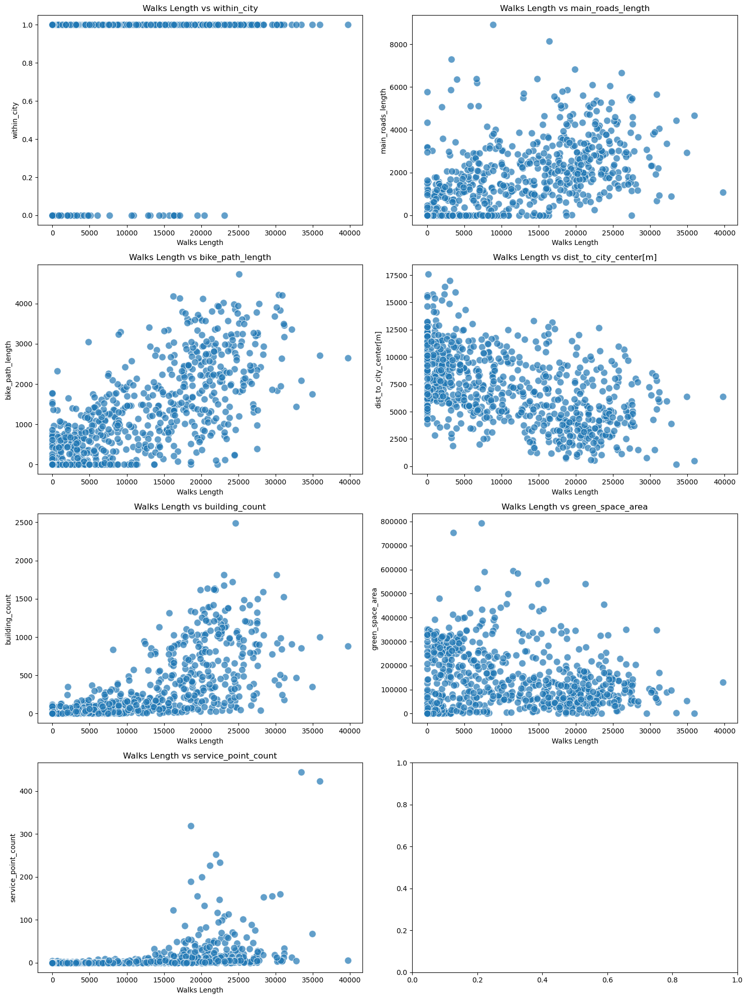

In [44]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

for i, var in enumerate(['within_city', 'main_roads_length', 'bike_path_length', 'dist_to_city_center[m]', 'building_count', 'green_space_area', 'service_point_count']):
    row = i // 2
    col = i % 2
    sns.scatterplot(x='walks_length', y=var, data=gdf_ams_pol, alpha=0.7, s=100, ax=axes[row, col])
    axes[row, col].set_title(f'Walks Length vs {var}')
    axes[row, col].set_xlabel('Walks Length')
    axes[row, col].set_ylabel(var)

plt.tight_layout()
plt.show()

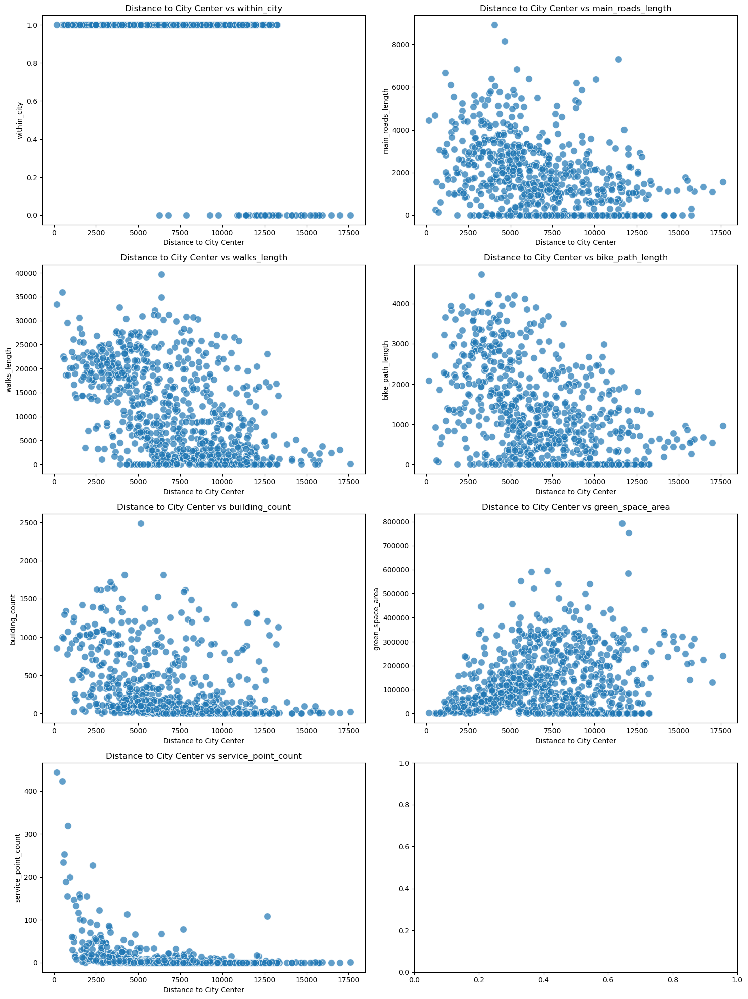

In [45]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

for i, var in enumerate(['within_city', 'main_roads_length', 'walks_length', 'bike_path_length', 'building_count', 'green_space_area', 'service_point_count']):
    row = i // 2
    col = i % 2
    sns.scatterplot(x='dist_to_city_center[m]', y=var, data=gdf_ams_pol, alpha=0.7, s=100, ax=axes[row, col])
    axes[row, col].set_title(f'Distance to City Center vs {var}')
    axes[row, col].set_xlabel('Distance to City Center')
    axes[row, col].set_ylabel(var)

plt.tight_layout()
plt.show()

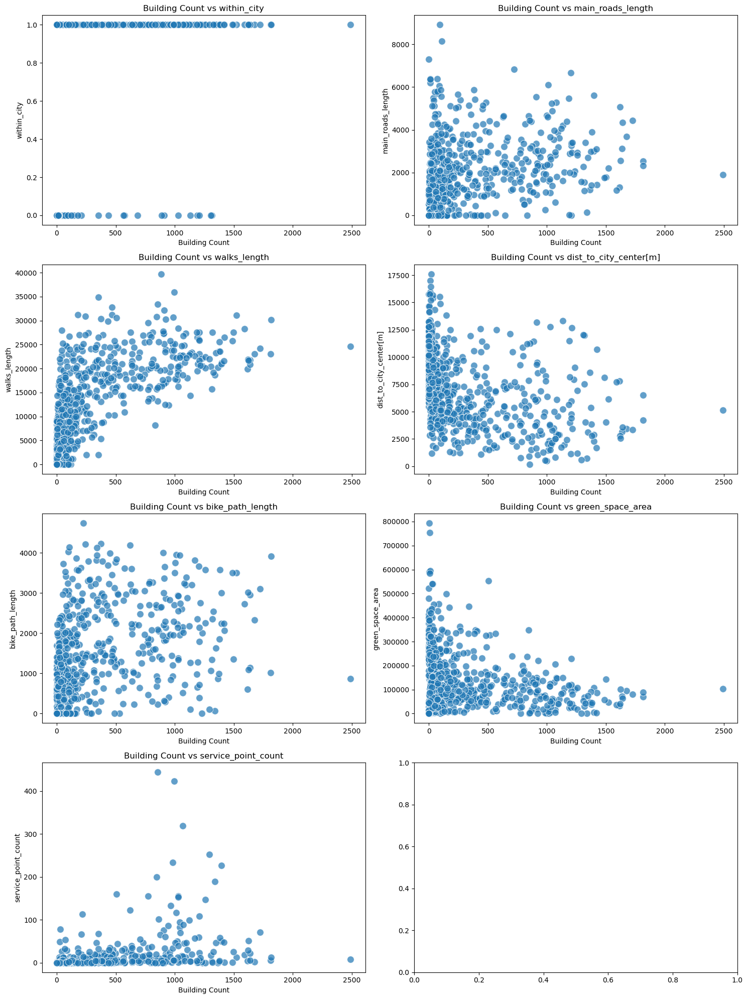

In [46]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

for i, var in enumerate(['within_city', 'main_roads_length', 'walks_length', 'dist_to_city_center[m]', 'bike_path_length', 'green_space_area', 'service_point_count']):
    row = i // 2
    col = i % 2
    sns.scatterplot(x='building_count', y=var, data=gdf_ams_pol, alpha=0.7, s=100, ax=axes[row, col])
    axes[row, col].set_title(f'Building Count vs {var}')
    axes[row, col].set_xlabel('Building Count')
    axes[row, col].set_ylabel(var)

plt.tight_layout()
plt.show()

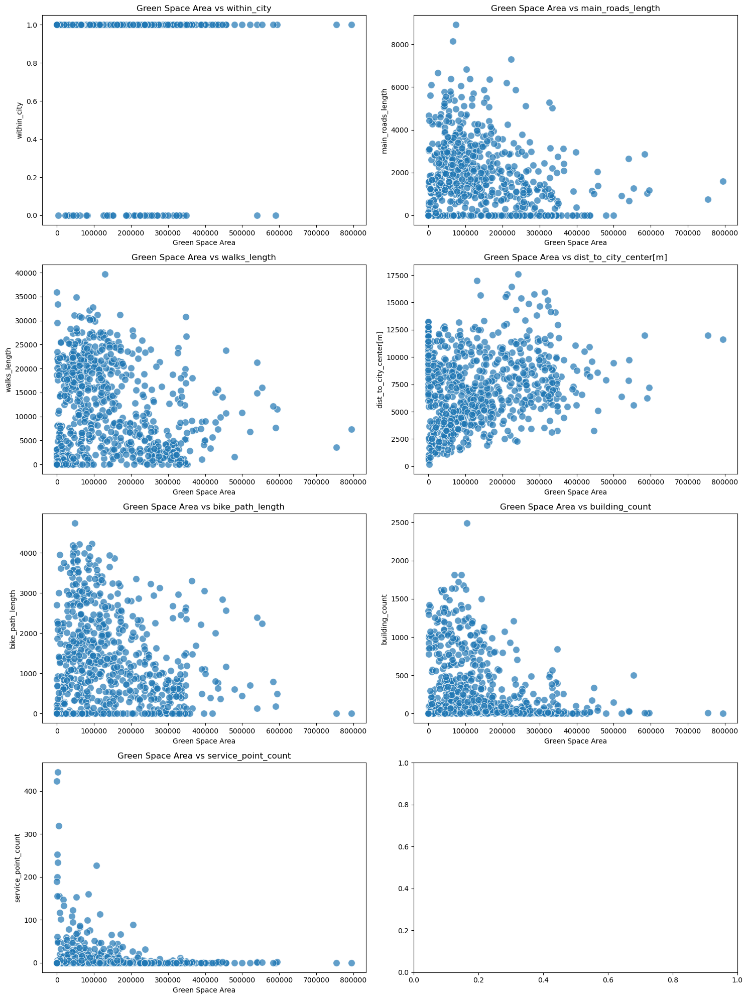

In [47]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

for i, var in enumerate(['within_city', 'main_roads_length', 'walks_length', 'dist_to_city_center[m]', 'bike_path_length', 'building_count', 'service_point_count']):
    row = i // 2
    col = i % 2
    sns.scatterplot(x='green_space_area', y=var, data=gdf_ams_pol, alpha=0.7, s=100, ax=axes[row, col])
    axes[row, col].set_title(f'Green Space Area vs {var}')
    axes[row, col].set_xlabel('Green Space Area')
    axes[row, col].set_ylabel(var)

plt.tight_layout()
plt.show()

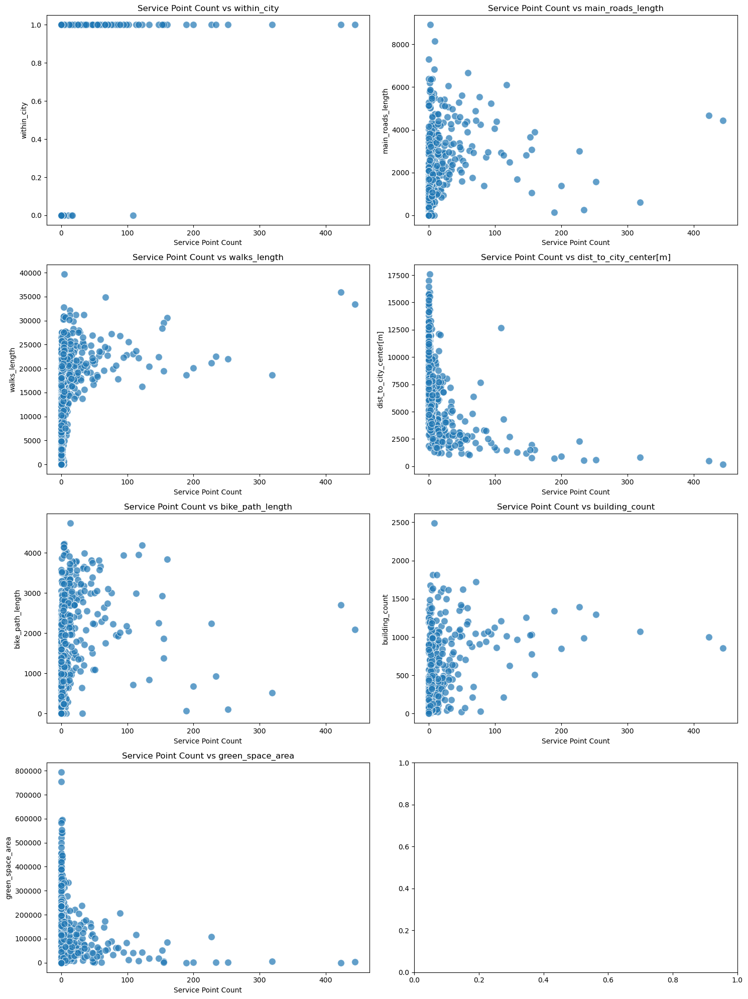

In [48]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

for i, var in enumerate(['within_city', 'main_roads_length', 'walks_length', 'dist_to_city_center[m]', 'bike_path_length', 'building_count', 'green_space_area']):
    row = i // 2
    col = i % 2
    sns.scatterplot(x='service_point_count', y=var, data=gdf_ams_pol, alpha=0.7, s=100, ax=axes[row, col])
    axes[row, col].set_title(f'Service Point Count vs {var}')
    axes[row, col].set_xlabel('Service Point Count')
    axes[row, col].set_ylabel(var)

plt.tight_layout()
plt.show()

In [49]:
gdf_ams_pol

,geometry,bike_path_length,within_city,main_roads_length,walks_length,dist_to_city_center[m],building_count,green_space_area,service_point_count
0,"POLYGON ((4.92310 52.41735, 4.92708 52.41854, ...",206.087544,True,2098.509540,5813.489633,5154.879288,29,226720.382262,0
1,"POLYGON ((4.86912 52.41706, 4.87310 52.41825, ...",741.473718,True,654.011608,12426.317471,4762.373953,67,64420.957879,0
3,"POLYGON ((4.96284 52.35752, 4.96683 52.35872, ...",469.120090,True,2341.332799,16288.325466,5439.435727,256,282819.839518,0
6,"POLYGON ((4.97253 52.30455, 4.97651 52.30575, ...",2221.874331,True,2135.979607,22099.434776,9781.879987,190,219504.399426,0
7,"POLYGON ((5.01897 52.30659, 5.02295 52.30779, ...",1922.459198,True,4003.971395,9222.543796,11756.381291,165,131286.653227,0
...,...,...,...,...,...,...,...,...,...
1408,"POLYGON ((5.03580 52.39148, 5.03977 52.39268, ...",0.000000,True,0.000000,0.000000,10147.838634,0,0.000000,0
1409,"POLYGON ((4.80389 52.34955, 4.80788 52.35075, ...",3914.396988,True,2321.388784,30118.913676,6496.898462,1815,88664.374879,12
1410,"POLYGON ((4.97788 52.35407, 4.98186 52.35527, ...",1166.097203,True,0.000000,15153.495338,6532.777122,495,162792.208498,5
1413,"POLYGON ((4.93370 52.40858, 4.93768 52.40977, ...",1288.509301,True,5145.555305,17977.505795,4735.933155,458,118207.036121,0


In [50]:
gdf_krk_pol

,geometry,bike_path_length,main_roads_length,walks_length
0,"POLYGON ((20.04005 50.02097, 20.03602 50.01833...",0.000000,2045.938824,10299.620003
1,"POLYGON ((19.89055 50.04318, 19.88653 50.04055...",601.074232,1198.911548,10221.141997
3,"POLYGON ((19.81007 49.99520, 19.80605 49.99257...",0.000000,0.000000,2985.767676
4,"POLYGON ((19.87822 50.09041, 19.87420 50.08778...",132.809314,1132.309188,22243.527807
5,"POLYGON ((19.99975 50.00384, 19.99573 50.00121...",0.000000,963.736359,16738.397276
...,...,...,...,...
1201,"POLYGON ((20.07227 50.03744, 20.06825 50.03480...",594.930899,1236.114292,8712.770615
1202,"POLYGON ((19.88215 50.11140, 19.87813 50.10877...",315.691166,562.269926,6966.941055
1203,"POLYGON ((19.95095 50.06885, 19.94693 50.06622...",1742.057905,5244.227377,62680.403588
1204,"POLYGON ((19.91496 50.00379, 19.91093 50.00116...",0.000000,445.531175,16061.984647


In [51]:
gdf_krk_pol = get_hex_dist_to_city_center(gdf_krk_pol, gdf_center_krk, 2180)
gdf_krk_pol

C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\pyproj\transformer.py:820: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return self._transformer._transform_point(


,geometry,bike_path_length,main_roads_length,walks_length,dist_to_city_center[m]
0,"POLYGON ((20.04005 50.02097, 20.03602 50.01833...",0.000000,2045.938824,10299.620003,8317.152895
1,"POLYGON ((19.89055 50.04318, 19.88653 50.04055...",601.074232,1198.911548,10221.141997,4058.715568
3,"POLYGON ((19.81007 49.99520, 19.80605 49.99257...",0.000000,0.000000,2985.767676,11815.516224
4,"POLYGON ((19.87822 50.09041, 19.87420 50.08778...",132.809314,1132.309188,22243.527807,5615.928354
5,"POLYGON ((19.99975 50.00384, 19.99573 50.00121...",0.000000,963.736359,16738.397276,7529.040659
...,...,...,...,...,...
1201,"POLYGON ((20.07227 50.03744, 20.06825 50.03480...",594.930899,1236.114292,8712.770615,9730.408592
1202,"POLYGON ((19.88215 50.11140, 19.87813 50.10877...",315.691166,562.269926,6966.941055,7093.420478
1203,"POLYGON ((19.95095 50.06885, 19.94693 50.06622...",1742.057905,5244.227377,62680.403588,1219.944851
1204,"POLYGON ((19.91496 50.00379, 19.91093 50.00116...",0.000000,445.531175,16061.984647,6515.907449


In [52]:
gdf_krk_pol = calculate_building_points(gdf_krk_pol)

C:\Users\Marcin\AppData\Local\Temp\ipykernel_27976\910374991.py:2: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  G_poi = osmnx.geometries_from_polygon(hex_gdf.geometry.unary_union, tags={poi_type: True})


In [53]:
gdf_krk_pol

,geometry,bike_path_length,main_roads_length,walks_length,dist_to_city_center[m],building_count
0,"POLYGON ((20.04005 50.02097, 20.03602 50.01833...",0.000000,2045.938824,10299.620003,8317.152895,111
1,"POLYGON ((19.89055 50.04318, 19.88653 50.04055...",601.074232,1198.911548,10221.141997,4058.715568,189
3,"POLYGON ((19.81007 49.99520, 19.80605 49.99257...",0.000000,0.000000,2985.767676,11815.516224,0
4,"POLYGON ((19.87822 50.09041, 19.87420 50.08778...",132.809314,1132.309188,22243.527807,5615.928354,307
5,"POLYGON ((19.99975 50.00384, 19.99573 50.00121...",0.000000,963.736359,16738.397276,7529.040659,206
...,...,...,...,...,...,...
1201,"POLYGON ((20.07227 50.03744, 20.06825 50.03480...",594.930899,1236.114292,8712.770615,9730.408592,76
1202,"POLYGON ((19.88215 50.11140, 19.87813 50.10877...",315.691166,562.269926,6966.941055,7093.420478,17
1203,"POLYGON ((19.95095 50.06885, 19.94693 50.06622...",1742.057905,5244.227377,62680.403588,1219.944851,120
1204,"POLYGON ((19.91496 50.00379, 19.91093 50.00116...",0.000000,445.531175,16061.984647,6515.907449,422


In [57]:
#hex_area_krk = unary_union(gdf_ams_krk.geometry)
#bbox_krk = (max_y, min_y, max_x, min_x)
gdf_krk_pol = get_green_space_by_hex(gdf_krk_pol, bbox_krk, hex_area_krk, 2180)
gdf_krk_pol

C:\Users\Marcin\AppData\Local\Temp\ipykernel_27976\238258605.py:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf_green = osmnx.geometries_from_bbox(*bbox, tags={'leisure': green_tags, 'landuse': green_tags, 'natural': ['wood', 'grassland']})
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\osmnx\geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)


,geometry,bike_path_length,main_roads_length,walks_length,dist_to_city_center[m],building_count,green_space_area
0,"POLYGON ((20.04005 50.02097, 20.03602 50.01833...",0.000000,2045.938824,10299.620003,8317.152895,111,115727.827637
1,"POLYGON ((19.89055 50.04318, 19.88653 50.04055...",601.074232,1198.911548,10221.141997,4058.715568,189,95767.039458
3,"POLYGON ((19.81007 49.99520, 19.80605 49.99257...",0.000000,0.000000,2985.767676,11815.516224,0,160059.510756
4,"POLYGON ((19.87822 50.09041, 19.87420 50.08778...",132.809314,1132.309188,22243.527807,5615.928354,307,131561.238845
5,"POLYGON ((19.99975 50.00384, 19.99573 50.00121...",0.000000,963.736359,16738.397276,7529.040659,206,224442.511238
...,...,...,...,...,...,...,...
1201,"POLYGON ((20.07227 50.03744, 20.06825 50.03480...",594.930899,1236.114292,8712.770615,9730.408592,76,21382.644779
1202,"POLYGON ((19.88215 50.11140, 19.87813 50.10877...",315.691166,562.269926,6966.941055,7093.420478,17,252027.967799
1203,"POLYGON ((19.95095 50.06885, 19.94693 50.06622...",1742.057905,5244.227377,62680.403588,1219.944851,120,25367.761296
1204,"POLYGON ((19.91496 50.00379, 19.91093 50.00116...",0.000000,445.531175,16061.984647,6515.907449,422,168741.342518


In [58]:
gdf_krk_pol = get_service_points_by_hex(gdf_krk_pol, bbox_krk, hex_area_krk, 2180)
gdf_krk_pol

C:\Users\Marcin\AppData\Local\Temp\ipykernel_27976\3704804016.py:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf_services = osmnx.geometries_from_bbox(*bbox, tags={'amenity': service_tags, 'shop': True})
C:\Users\Marcin\anaconda3\envs\ADWNOZ\Lib\site-packages\osmnx\geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)


,geometry,bike_path_length,main_roads_length,walks_length,dist_to_city_center[m],building_count,green_space_area,service_point_count
0,"POLYGON ((20.04005 50.02097, 20.03602 50.01833...",0.000000,2045.938824,10299.620003,8317.152895,111,115727.827637,1
1,"POLYGON ((19.89055 50.04318, 19.88653 50.04055...",601.074232,1198.911548,10221.141997,4058.715568,189,95767.039458,2
3,"POLYGON ((19.81007 49.99520, 19.80605 49.99257...",0.000000,0.000000,2985.767676,11815.516224,0,160059.510756,0
4,"POLYGON ((19.87822 50.09041, 19.87420 50.08778...",132.809314,1132.309188,22243.527807,5615.928354,307,131561.238845,2
5,"POLYGON ((19.99975 50.00384, 19.99573 50.00121...",0.000000,963.736359,16738.397276,7529.040659,206,224442.511238,4
...,...,...,...,...,...,...,...,...
1201,"POLYGON ((20.07227 50.03744, 20.06825 50.03480...",594.930899,1236.114292,8712.770615,9730.408592,76,21382.644779,0
1202,"POLYGON ((19.88215 50.11140, 19.87813 50.10877...",315.691166,562.269926,6966.941055,7093.420478,17,252027.967799,3
1203,"POLYGON ((19.95095 50.06885, 19.94693 50.06622...",1742.057905,5244.227377,62680.403588,1219.944851,120,25367.761296,273
1204,"POLYGON ((19.91496 50.00379, 19.91093 50.00116...",0.000000,445.531175,16061.984647,6515.907449,422,168741.342518,0


In [62]:
gdf_ams_pol.within_city

0       True
1       True
3       True
6       True
7       True
        ... 
1408    True
1409    True
1410    True
1413    True
1415    True
Name: within_city, Length: 752, dtype: bool

In [69]:
gdf_krk_pol.to_file('../data/processed/gdf_krk.shp')

ImportError: The 'to_file' method requires the 'pyogrio' or 'fiona' package, but neither is installed or imports correctly.
Importing fiona resulted in: DLL load failed while importing _env: Nie można odnaleźć określonej procedury.
Importing pyogrio resulted in: No module named 'pyogrio'

In [74]:
gdf_krk_pol.to_parquet('../data/processed/gdf_krk.parquet')

In [75]:
gdf_ams_pol.to_parquet('../data/processed/gdf_ams.parquet')